ref: https://albumentations.ai/docs/examples

# Simple Augmentations for 8-bit images

In [1]:
import random
import numpy as np
import os

import cv2
from matplotlib import pyplot as plt

import albumentations as A

/Users/qureshsu/miniforge3/envs/dissertation/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def visualize(image):
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)

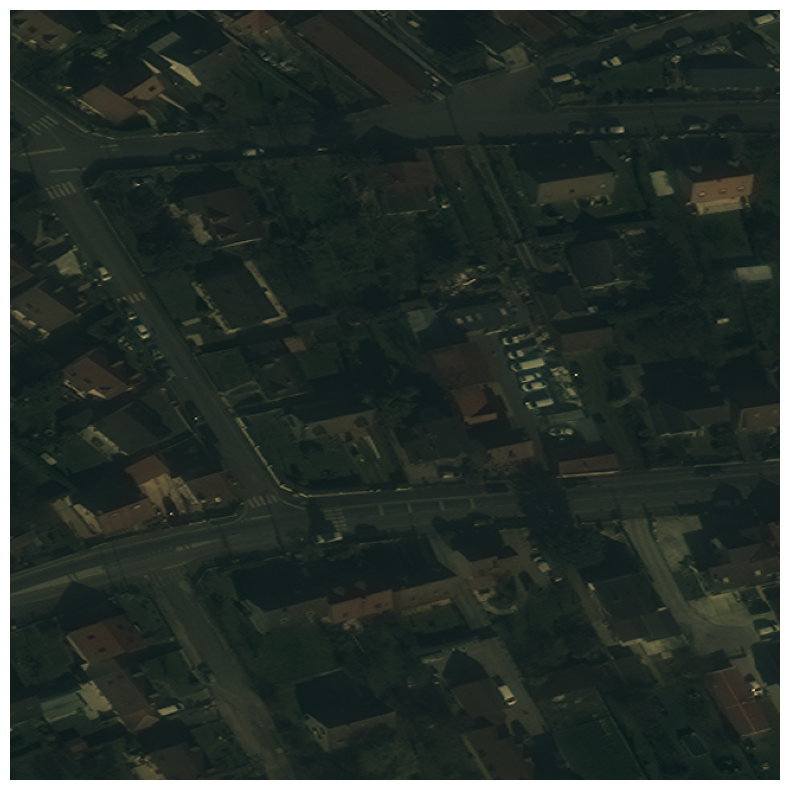

In [3]:
image_dir = "../../datasets/SpaceNet/AOI_3_Paris_Train/SN2_buildings/processed/multi_channel_masks/train/images"

image = np.load(os.path.join(image_dir, "86.npy"))
visualize(image)

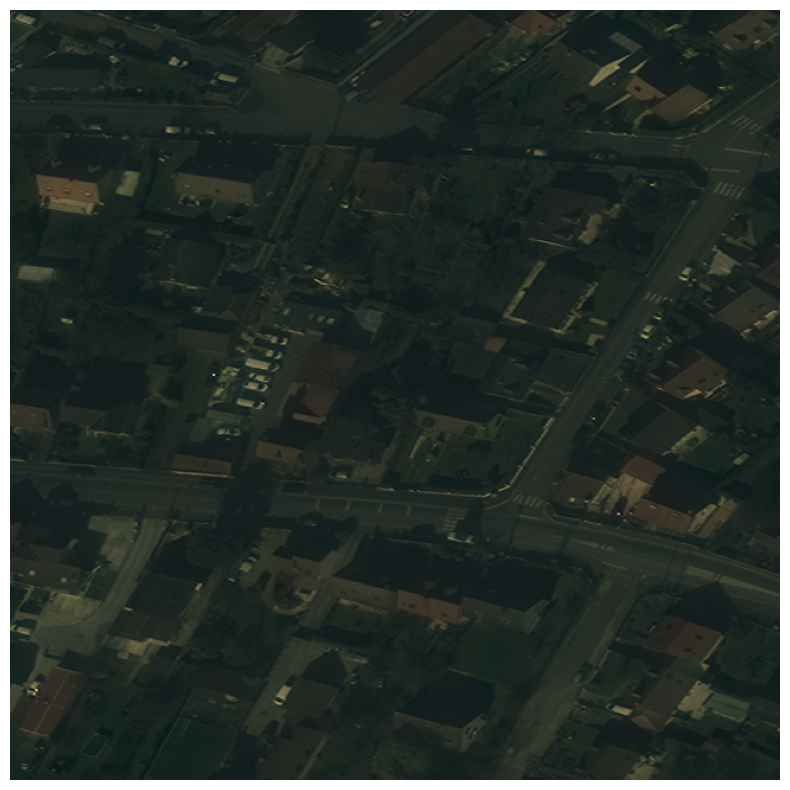

In [6]:
transform = A.HorizontalFlip(p=0.5)
random.seed(7)
augmented_image = transform(image=image)['image']
visualize(augmented_image)

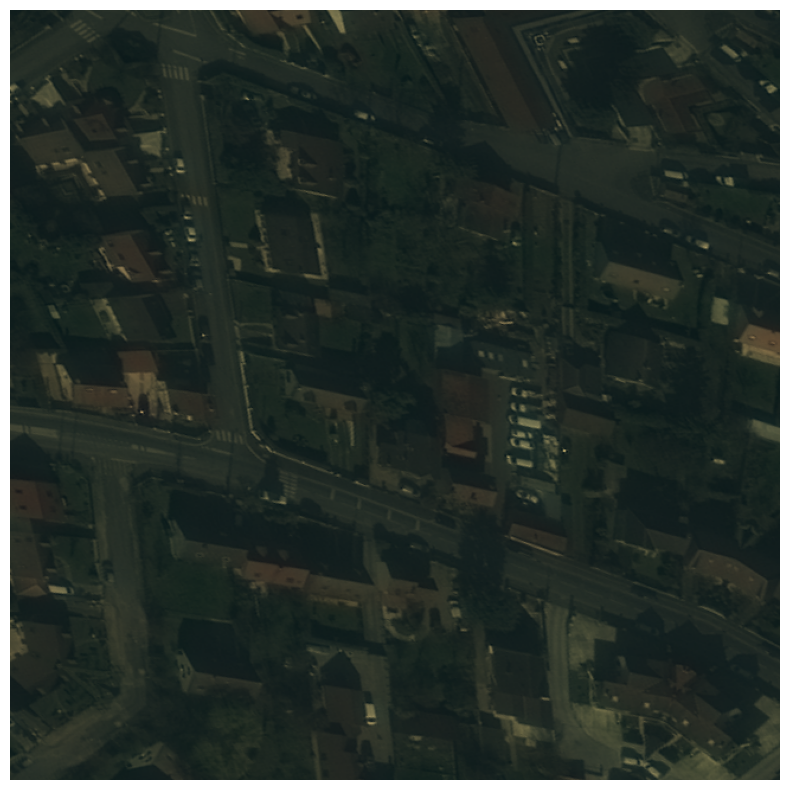

In [7]:
transform = A.ShiftScaleRotate(p=0.5)
random.seed(7)
augmented_image = transform(image=image)['image']
visualize(augmented_image)

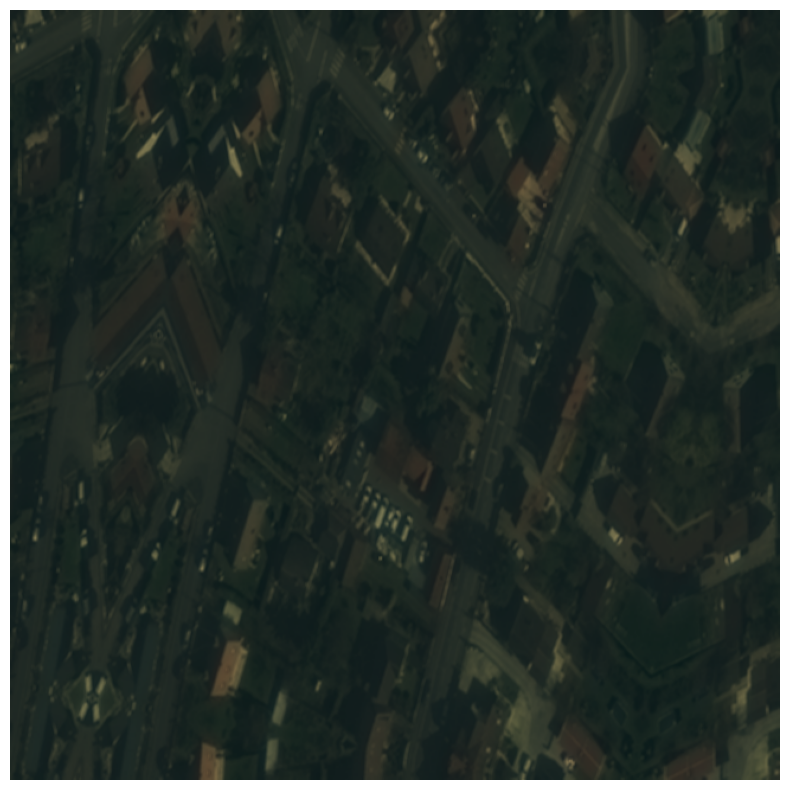

In [8]:
transform = A.Compose([
    A.CLAHE(),
    A.RandomRotate90(),
    A.Transpose(),
    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.50, rotate_limit=45, p=.75),
    A.Blur(blur_limit=3),
    A.OpticalDistortion(),
    A.GridDistortion(),
    A.HueSaturationValue(),
])
random.seed(42)
augmented_image = transform(image=image)['image']
visualize(augmented_image)

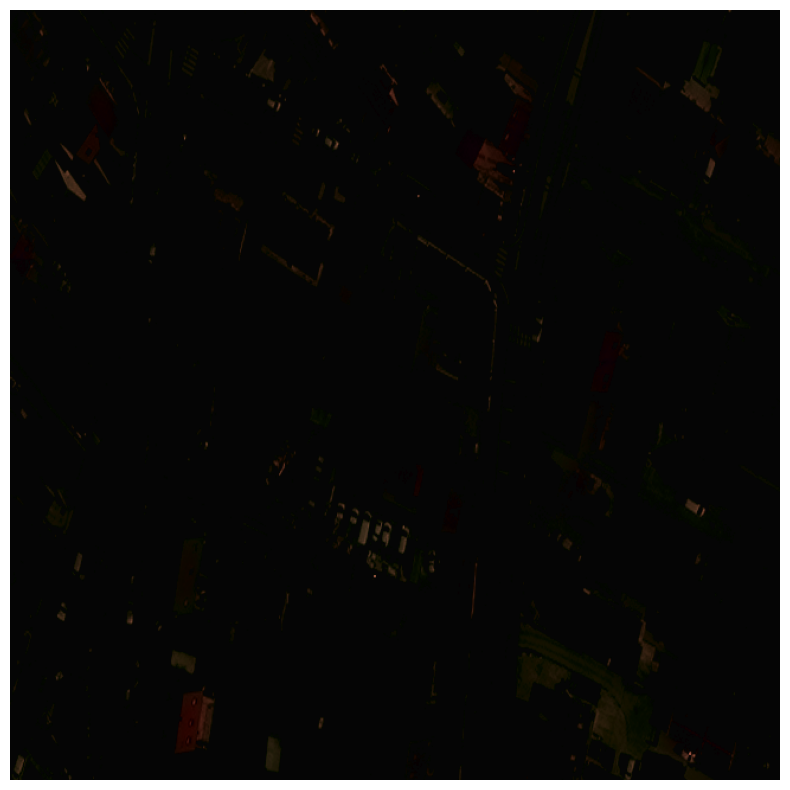

In [11]:
transform = A.Compose([
        A.RandomRotate90(),
        A.VerticalFlip(),
        A.Transpose(),
        A.GaussNoise(),
        A.OneOf([
            A.MotionBlur(p=.2),
            A.MedianBlur(blur_limit=3, p=0.1),
            A.Blur(blur_limit=3, p=0.1),
        ], p=0.2),
        A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=45, p=0.2),
        A.OneOf([
            A.OpticalDistortion(p=0.3),
            A.GridDistortion(p=.1),
        ], p=0.2),
        A.OneOf([
            A.CLAHE(clip_limit=2),
            A.RandomBrightnessContrast(),
        ], p=0.3),
        A.HueSaturationValue(p=0.3),
    ])
random.seed(42)
augmented_image = transform(image=image)['image']
visualize(augmented_image)

# Augmentations for non 8-bit images | 16-bit, 32-bit, 64-bit etc Tiff images.
## Useful for satellite images.

It has it's own overhead. .npy file is easier to work with. However the tiff image looks better. consider at the end stage if needs further improvement in model performance.





In [12]:
import random

import cv2
from matplotlib import pyplot as plt

import albumentations as A

In [20]:
import cv2

def get_tiff_bit_depth(file_path):
    # Read the image using OpenCV
    image = cv2.imread(file_path, cv2.IMREAD_UNCHANGED)
    
    if image is None:
        raise ValueError(f"Could not open or find the image: {file_path}")

    # Get the depth of the image
    depth = image.dtype

    # Determine bit depth based on dtype
    if depth == 'uint8':
        return 8
    elif depth == 'uint16':
        return 16
    elif depth == 'int32' or depth == 'float32':
        return 32
    elif depth == 'float64':
        return 64
    else:
        return "Unknown or unsupported bit depth"

# Example usage
image_dir = '../../datasets/Spacenet/AOI_3_Paris_Train/RGB-PanSharpen/RGB-PanSharpen_AOI_3_Paris_img86.tif'
bit_depth = get_tiff_bit_depth(image_dir)
print(f"Bit depth: {bit_depth}")

Bit depth: 16


In [27]:
import tifffile

def get_tiff_bit_depth(file_path):
    with tifffile.TiffFile(file_path) as tif:
        # Access the first page of the TIFF file
        page = tif.pages[0]
        # Get the bit depth from the dtype
        bit_depth = page.dtype.itemsize * 8
        return bit_depth

# Example usage
image_dir = '../../datasets/Spacenet/AOI_3_Paris_Train/RGB-PanSharpen/RGB-PanSharpen_AOI_3_Paris_img86.tif'
bit_depth = get_tiff_bit_depth(image_dir)
print(f"Bit depth: {bit_depth}")

Bit depth: 16


Data type: uint16
Min value: 7, Max value: 1763


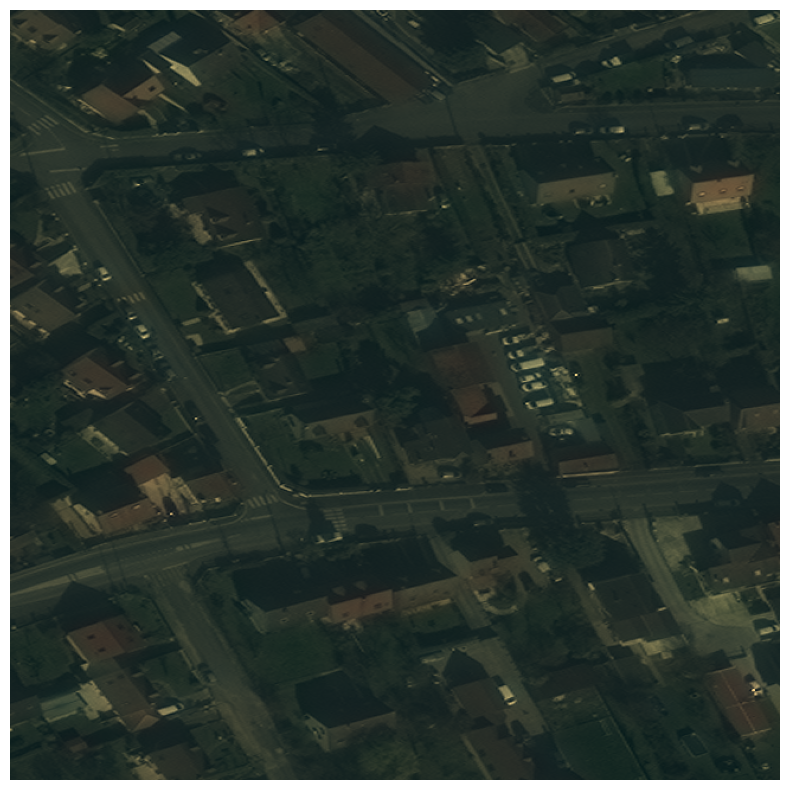

In [37]:
import tifffile
import numpy as np
import matplotlib.pyplot as plt

def visualize_with_tifffile(file_path):
    # Read the image using tifffile
    image = tifffile.imread(file_path)
    
    # Print data type and range for debugging
    print(f"Data type: {image.dtype}")
    print(f"Min value: {np.min(image)}, Max value: {np.max(image)}")

    # Normalize the image for display
    min_value = np.min(image)
    max_value = np.max(image)
    image = (image - min_value) / (max_value - min_value)
    image = np.clip(image, 0, 1)  # Ensure values are within [0, 1] range

    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)
    plt.show()

# Example usage
image_dir = '../../datasets/Spacenet/AOI_3_Paris_Train/RGB-PanSharpen/RGB-PanSharpen_AOI_3_Paris_img86.tif'
visualize_with_tifffile(image_dir)

In [38]:

transform = A.Compose([
    A.ToFloat(max_value=65535.0),

    A.RandomRotate90(),
    A.VerticalFlip(),
    A.OneOf([
        A.MotionBlur(p=0.2),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.Blur(blur_limit=3, p=0.1),
    ], p=0.2),
    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=45, p=0.2),
    A.OneOf([
        A.OpticalDistortion(p=0.3),
        A.GridDistortion(p=0.1),
    ], p=0.2),
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=0.1, val_shift_limit=0.1, p=0.3),

    A.FromFloat(max_value=65535.0),
])

(<Figure size 988.8x604.8 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x31271c730>)

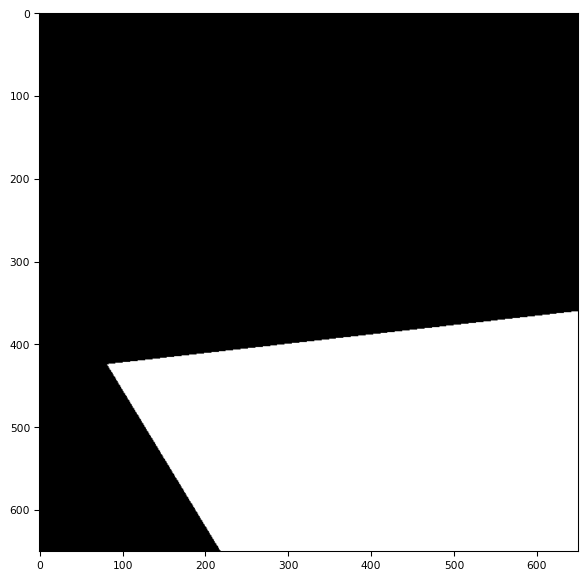

In [41]:
random.seed(7)
augmented = transform(image=image)
tifffile.imshow(augmented['image'])


# Chromatic Augmentations | Color Jittering (Color Effects)

This can be used for satellite images.

In [42]:
import cv2
from matplotlib import pyplot as plt
import cv2

import albumentations as A

In [49]:
def visualize(image):
    plt.figure(figsize=(10, 5))
    plt.axis('off')
    plt.imshow(image)

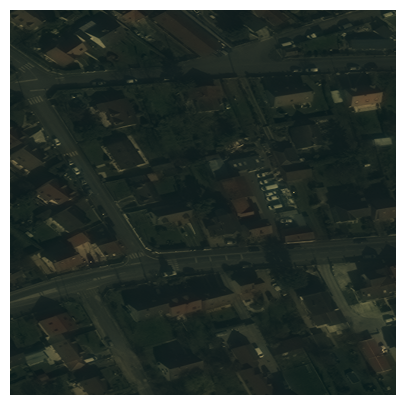

In [50]:
image_dir = "../../datasets/SpaceNet/AOI_3_Paris_Train/SN2_buildings/processed/multi_channel_masks/train/images"

image = np.load(os.path.join(image_dir, "86.npy"))
visualize(image)

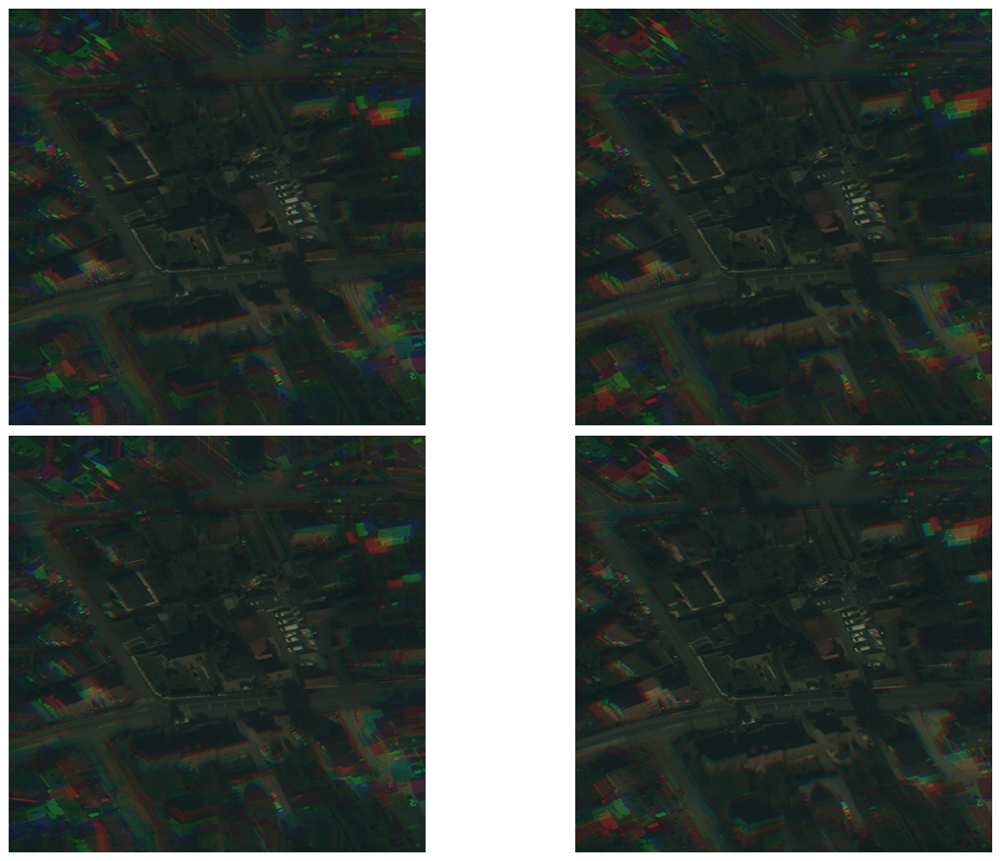

In [53]:
transform = A.Compose([A.ChromaticAberration(mode="red_blue", primary_distortion_limit=0.5, secondary_distortion_limit=0.1, p=1)])

plt.figure(figsize=(15, 10))

num_images = 4

# Loop through the list of images and plot them with subplot
for i in range(num_images):
    transformed_image = transform(image = image)["image"]
    plt.subplot(2, 2, i + 1)
    plt.imshow(transformed_image)
    plt.axis('off')

plt.tight_layout()
plt.show()

# D4 Transformations

Geomatric transforms are the most widely used augmentations. Mainly becase they do not get data outside of the original data distribution and because they "They make intuitive sense".

D4 transform maps orignal image to one of 8 states.

e - identity. The original image

r90 - rotation by 90 degrees

r180 - rotation by 180 degrees, which is equal to v * h = h * v

r270 - rotation by 270 degrees

v - vertical flip

hvt - reflection across anti diagonal, which is equal to t * v * h or t * rot180

h - horizonal flip

t - reflection actoss the diagonal

The transform is useful in situations where imagery data does not have preferred orientation:

For example: - medical images - top view drone and satellite imagery

Works for: - image - mask - keypoints - bounding boxes

# Domain adaptation transforms

can provide a reference image to transform the setellite imagery to the reference image.

ref: https://albumentations.ai/docs/examples/example_domain_adaptation/

# RandomGridShuffle 

This transformation divides the image into a grid and then permutes these grid cells based on a random mapping.

This can be useful.

# Albumentations for a semantic segmentation

Example augmentations

In [4]:
import random
import numpy as np
import os
import torch

import cv2
from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap

import albumentations as A

from src.datasets.custom_datasets.spacenet_dataset import CustomSpacenetDataset

In [5]:
def visualize_from_dataset(image, mask, transformed_image=None, transformed_mask=None):
    fontsize = 18
    
    # Convert tensors to numpy arrays for visualization
    if isinstance(image, torch.Tensor):
        image = image.permute(1, 2, 0).numpy().astype("uint8")  # Convert from CxHxW to HxWxC
    if isinstance(mask, torch.Tensor):
        mask = mask.numpy()  # HxW
    
    image = image.astype("uint8")
    
    # Define a custom colormap
    # cmap = ListedColormap(['black', 'red', 'yellow', 'blue'])  # Colors: background, building footprint, boundary, contact point
    cmap = ListedColormap(['#2E2E2E', '#FFA500', '#00FFFF', '#FF00FF'])  # Dark Gray, Orange, Cyan, Magenta
    # cmap = ListedColormap(['#FFFFFF', '#008000', '#800080', '#A52A2A'])  # White, Green, Purple, Brown
    # cmap = ListedColormap(['#D3D3D3', '#008080', '#FFC0CB', '#808000'])  # Light Gray, Teal, Pink, Olive

    if transformed_image is None and transformed_mask is None:
        f, ax = plt.subplots(2, 1, figsize=(8, 8))

        ax[0].imshow(image)
        ax[0].set_title('Original image', fontsize=fontsize)
        ax[1].imshow(mask, cmap=cmap)
        ax[1].set_title('Original mask', fontsize=fontsize)

    else:
        transformed_image = transformed_image.astype("uint8")#.permute(1, 2, 0).numpy().astype("uint8")
        transformed_mask = transformed_mask#.numpy()

        f, ax = plt.subplots(2, 2, figsize=(8, 8))

        ax[0, 0].imshow(image)
        ax[0, 0].set_title('Original image', fontsize=fontsize)

        ax[1, 0].imshow(mask, cmap=cmap)
        ax[1, 0].set_title('Original mask', fontsize=fontsize)

        ax[0, 1].imshow(transformed_image)
        ax[0, 1].set_title('Transformed image', fontsize=fontsize)

        ax[1, 1].imshow(transformed_mask, cmap=cmap)
        ax[1, 1].set_title('Transformed mask', fontsize=fontsize)

    plt.show()

In [6]:
image_dir = "../../datasets/SpaceNet/AOI_3_Paris_Train/SN2_buildings/processed/multi_channel_masks/train/images"
mask_dir = "../../datasets/SpaceNet/AOI_3_Paris_Train/SN2_buildings/processed/multi_channel_masks/train/masks"

In [7]:
dataset = CustomSpacenetDataset(image_dir, mask_dir)
print(len(dataset))


506


torch.Size([3, 650, 650]) torch.Size([650, 650])


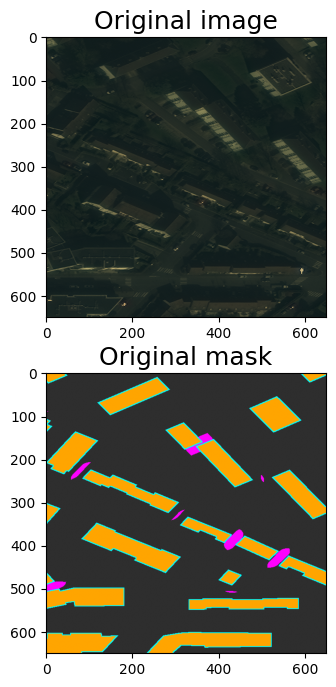

In [8]:
idx = random.choice(range(len(dataset)-1))
image, mask = dataset[idx]
original_height, original_width = image.shape[1:] # img.shape = CxHxW
print(image.shape, mask.shape)
visualize_from_dataset(image, mask)

## Testing the augmentations

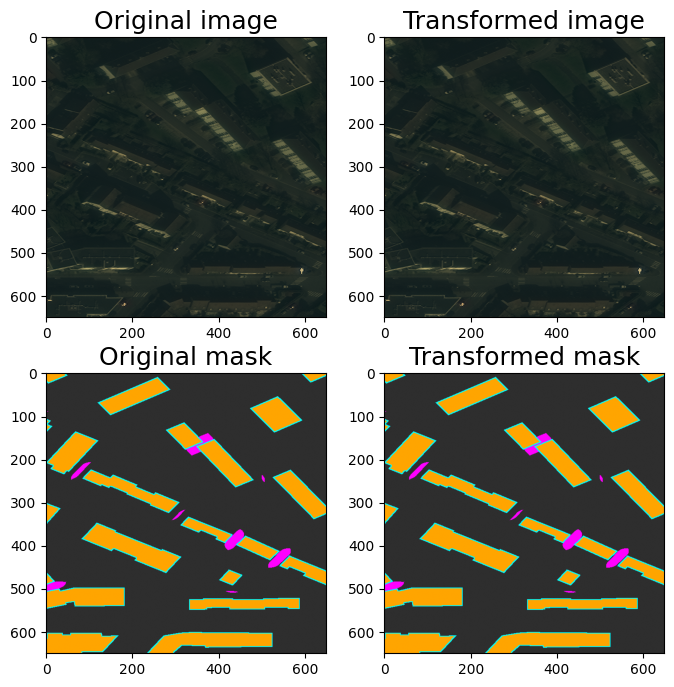

In [155]:
aug = A.Blur(blur_limit=7, p=0.05)

augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_padded = augmented['image']
mask_padded = augmented['mask']

# Visualize original and augmented images and masks
visualize_from_dataset(image, mask, image_padded, mask_padded)

## Padding

UNet type architecture requires input image size be divisible by 2^N, where N is the number of maxpooling layers. In the vanilla UNet N=5 \Longrightarrow, we need to pad input images to the closest divisible by 2^5 = 32 number, which is 128. This operation may be performed using PadIfNeeded transformation. It pads both the image and the mask on all four sides. Padding type (zero, constant, reflection) may be specified. The default padding is reflection padding.

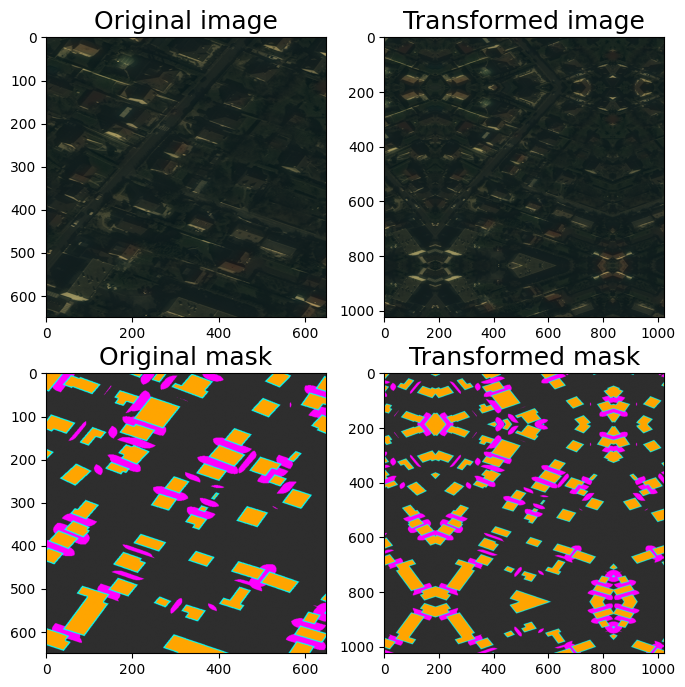

In [68]:
aug = A.PadIfNeeded(min_height=1024, min_width=1024, p=1) # our image size is 650x650

augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_padded = augmented['image']
mask_padded = augmented['mask']

# Visualize original and augmented images and masks
visualize_from_dataset(image, mask, image_padded, mask_padded)

## CenterCrop and Crop

To get to the original image and mask from the padded version, we may use CenterCrop or Crop transformations.

Center crop is also useful for BFP.

(650, 650, 3) (650, 650)


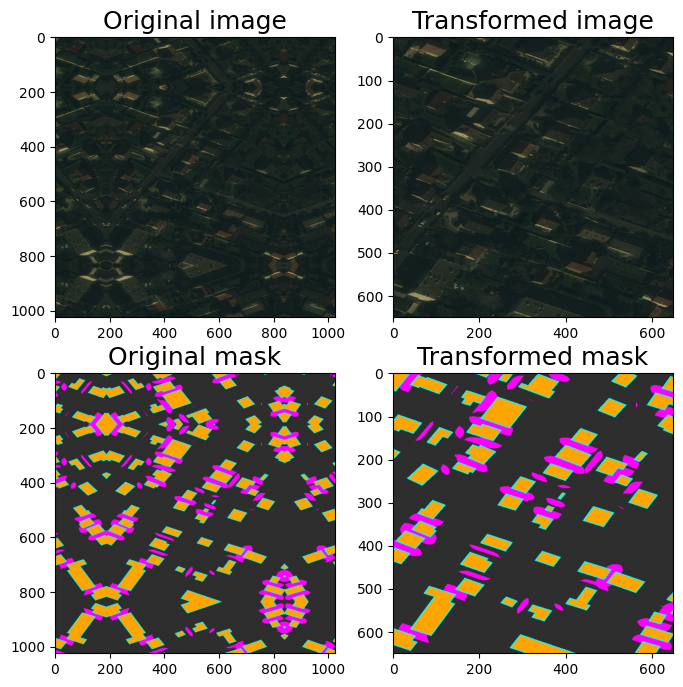

In [69]:
aug = A.CenterCrop(p=1, height=original_height, width=original_width)

augmented = aug(image=image_padded, mask=mask_padded)

image_center_cropped = augmented['image']
mask_center_cropped = augmented['mask']

print(image_center_cropped.shape, mask_center_cropped.shape)

assert (image.permute(1, 2, 0).numpy() - image_center_cropped).sum() == 0
assert (mask - mask_center_cropped).sum() == 0

visualize_from_dataset(image_padded, mask_padded, transformed_image=image_center_cropped, transformed_mask=mask_center_cropped)

(650, 650, 3) (650, 650)


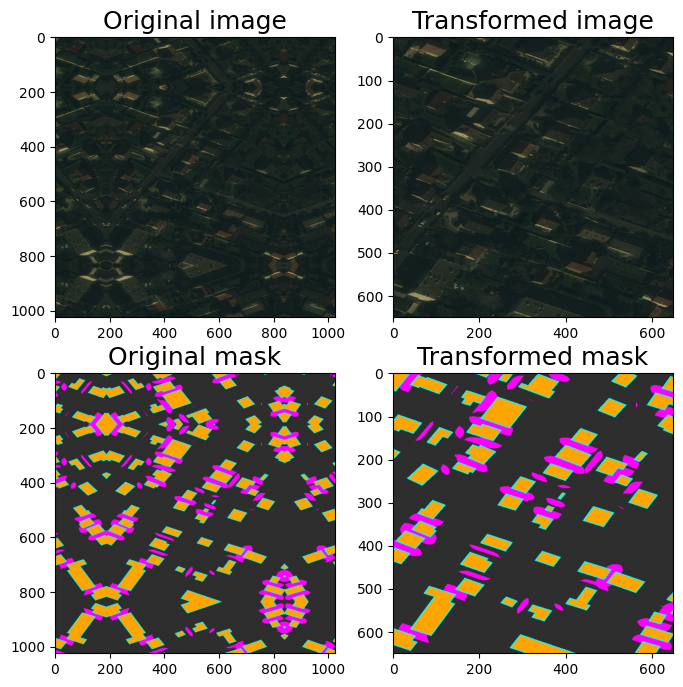

In [71]:
x_min = (1024 - original_width) // 2
y_min = (1024 - original_height) // 2

x_max = x_min + original_width
y_max = y_min + original_height

aug = A.Crop(x_min=x_min, x_max=x_max, y_min=y_min, y_max=y_max, p=1)

augmented = aug(image=image_padded, mask=mask_padded)

image_cropped = augmented['image']
mask_cropped = augmented['mask']

print(image_cropped.shape, mask_cropped.shape)

assert (image.permute(1, 2, 0).numpy() - image_cropped).sum() == 0
assert (mask - mask_cropped).sum() == 0

visualize_from_dataset(image_padded, mask_padded, transformed_image=image_cropped, transformed_mask=mask_cropped)

## Non destructive transformations

For images for which there is no clear notion of top like this one, satellite and aerial imagery or medical imagery is typically a good idea to add transformations that do not add or lose the information.

There are eight distinct ways to represent the same square on the plane.

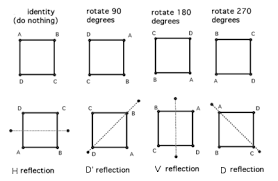

Combinations of the transformations HorizontalFlip, VerticalFlip, Transpose, RandomRotate90 will be able to get the original image to all eight states.

### HorizontalFlip

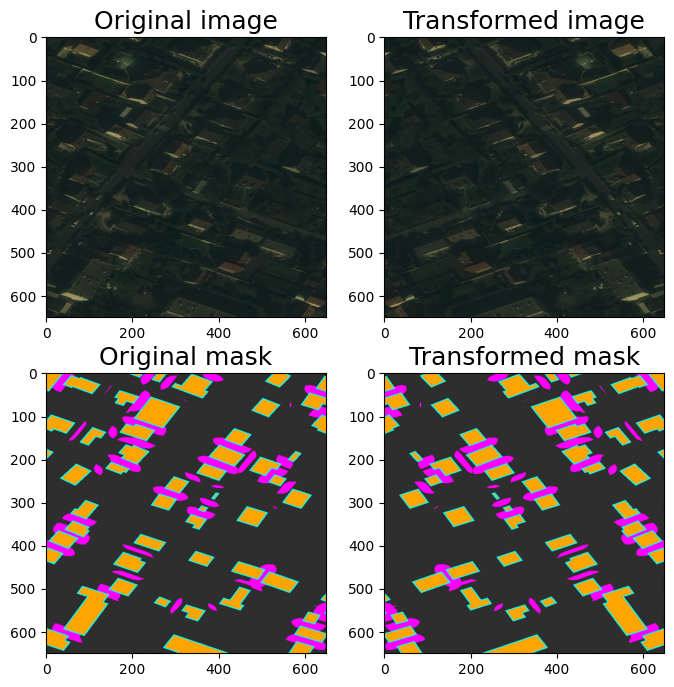

In [76]:
aug = A.HorizontalFlip(p=1)

augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_h_flipped = augmented['image']
mask_h_flipped = augmented['mask']

visualize_from_dataset(image, mask, transformed_image=image_h_flipped, transformed_mask=mask_h_flipped)


### VerticalFlip

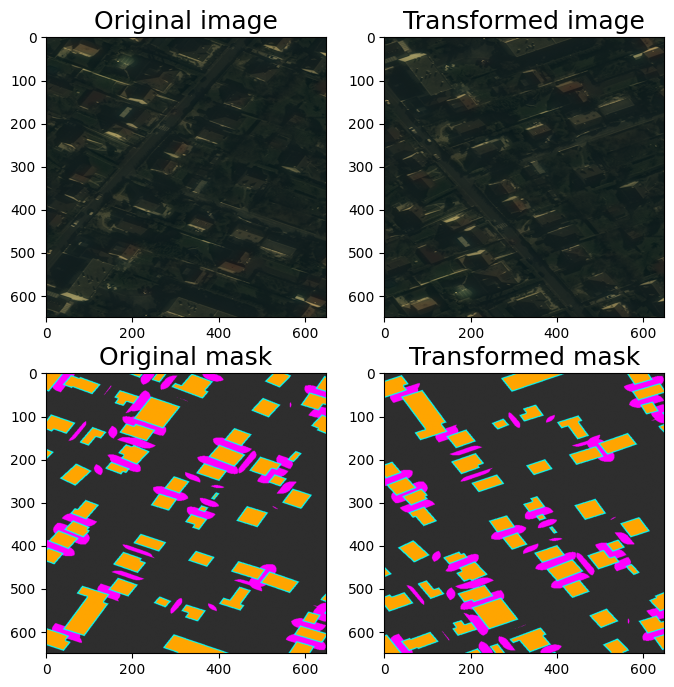

In [77]:
aug = A.VerticalFlip(p=1)

augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_v_flipped = augmented['image']
mask_v_flipped = augmented['mask']

visualize_from_dataset(image, mask, transformed_image=image_v_flipped, transformed_mask=mask_v_flipped)

### RandomRotate90 (Randomly rotates by 0, 90, 180, 270 degrees)

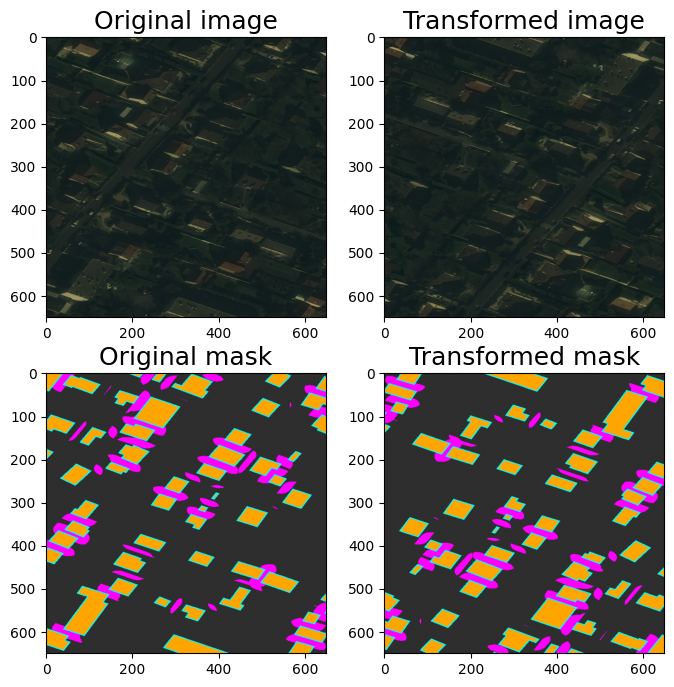

In [79]:
aug = A.RandomRotate90(p=1)

augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_rot90 = augmented['image']
mask_rot90 = augmented['mask']

visualize_from_dataset(image, mask, transformed_image=image_rot90, transformed_mask=mask_rot90)


### Transpose (switch X and Y axis)

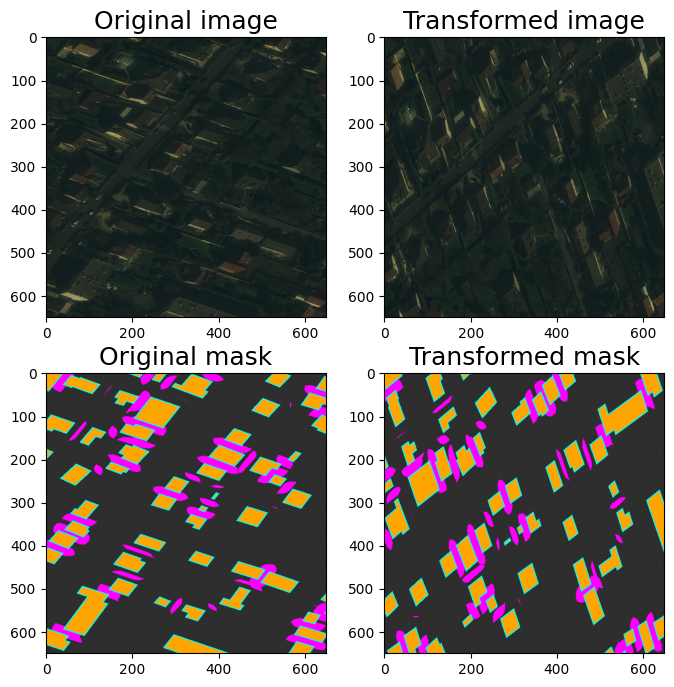

In [80]:
aug = A.Transpose(p=1)

augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_transposed = augmented['image']
mask_transposed = augmented['mask']

visualize_from_dataset(image, mask, transformed_image=image_transposed, transformed_mask=mask_transposed)

## Non-rigid transformations: ElasticTransform, GridDistortion, OpticalDistortion

In medical imaging problems, non-rigid transformations help to augment the data. It is unclear if they will help with this problem, but let's look at them. We will consider ElasticTransform, GridDistortion, OpticalDistortion.

We fix the random seed for visualization purposes, so the augmentation will always produce the same result. In a real computer vision pipeline, you shouldn't fix the random seed before applying a transform to the image because, in that case, the pipeline will always output the same image. The purpose of image augmentation is to use different transformations each time.

### ElasticTransform

For BFP does not seem to be useful.

/var/folders/g3/c_mlx1gn2dd8y29m20s40fcr0000gp/T/ipykernel_10053/226978866.py:1: UserWarning: Argument 'alpha_affine' is not valid and will be ignored.
  aug = A.ElasticTransform(p=1, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03)


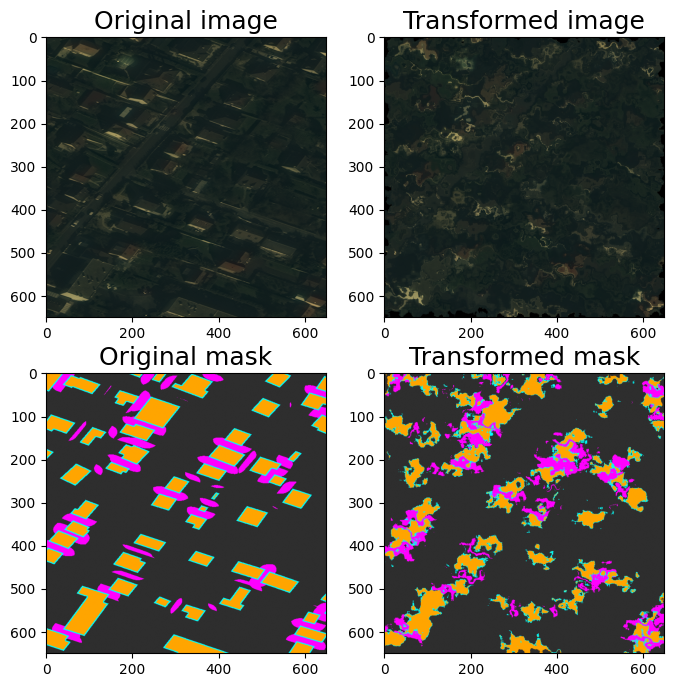

In [83]:
aug = A.ElasticTransform(p=1, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03)

random.seed(7)
augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_elastic = augmented['image']
mask_elastic = augmented['mask']

visualize_from_dataset(image, mask, transformed_image=image_elastic, transformed_mask=mask_elastic)

### GridDistortion

Seems to be useful.

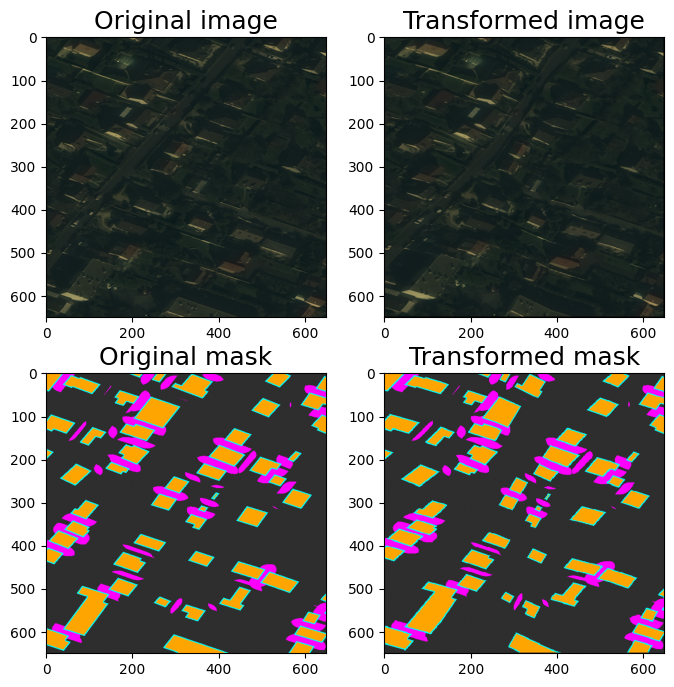

In [85]:
aug = A.GridDistortion(p=1)

random.seed(7)
augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_grid = augmented['image']
mask_grid = augmented['mask']

visualize_from_dataset(image, mask, transformed_image=image_grid, transformed_mask=mask_grid)

### OpticalDistortion

look at its effect on the edge of images and mask. It may or may not be useful for BFP.

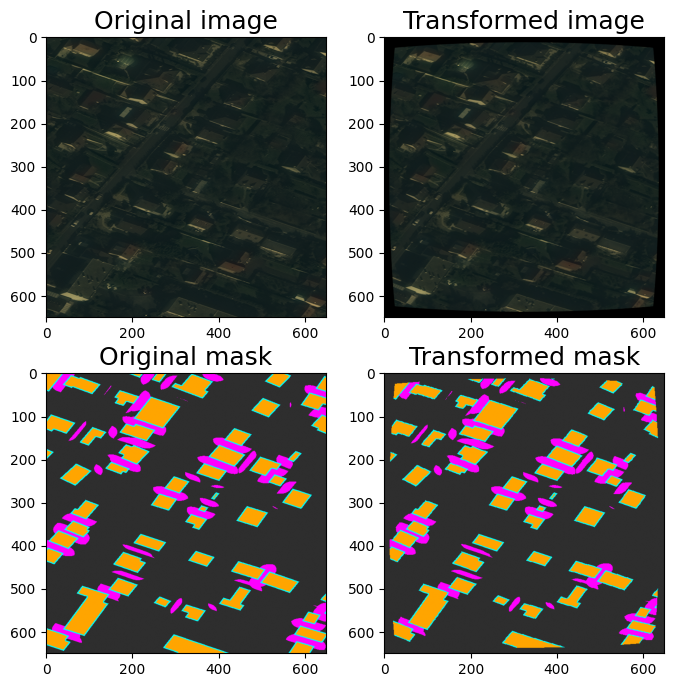

In [86]:
aug = A.OpticalDistortion(distort_limit=2, shift_limit=0.5, p=1)

random.seed(7)
augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_optical = augmented['image']
mask_optical = augmented['mask']

visualize_from_dataset(image, mask, transformed_image=image_optical, transformed_mask=mask_optical)

## RandomSizedCrop

One may combine RandomCrop and RandomScale but there is a transformation RandomSizedCrop that allows to combine them into one transformation.

This is useful for BFP.

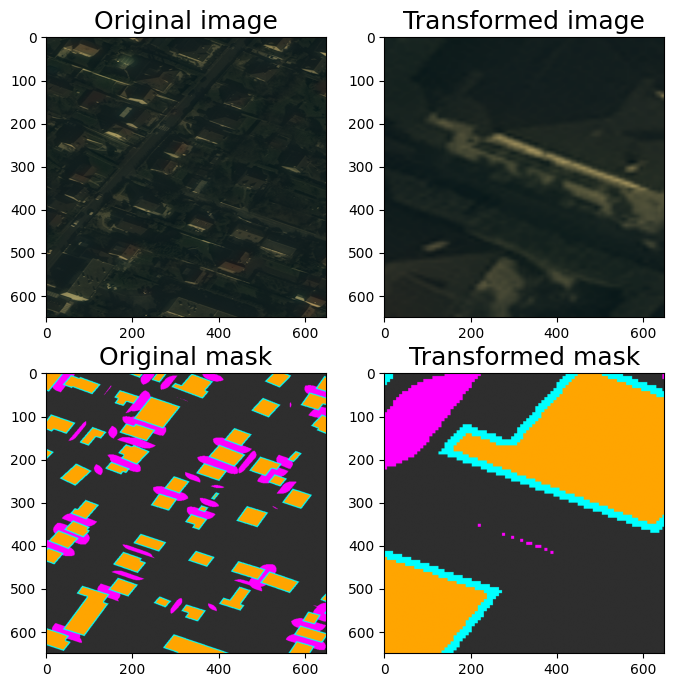

In [87]:
aug = A.RandomSizedCrop(min_max_height=(50, 101), height=original_height, width=original_width, p=1)

random.seed(7)
augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_scaled = augmented['image']
mask_scaled = augmented['mask']

visualize_from_dataset(image, mask, transformed_image=image_scaled, transformed_mask=mask_scaled)

## Let's try to combine different transformations

### Light non-destructive augmentations.

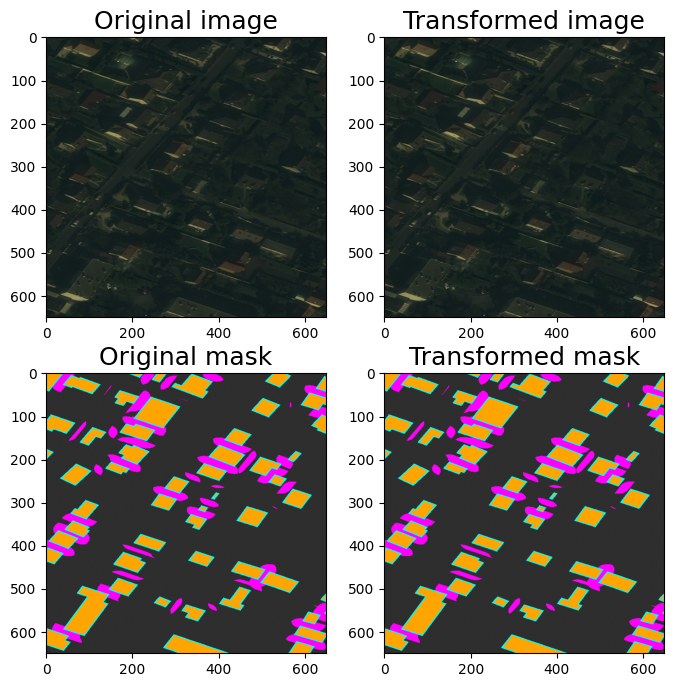

In [88]:
aug = A.Compose([
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5)]
)

random.seed(7)
augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_light = augmented['image']
mask_light = augmented['mask']

visualize_from_dataset(image, mask, transformed_image=image_light, transformed_mask=mask_light)

### Let's add non rigid transformations and RandomSizedCrop

/var/folders/g3/c_mlx1gn2dd8y29m20s40fcr0000gp/T/ipykernel_10053/2906952419.py:9: UserWarning: Argument 'alpha_affine' is not valid and will be ignored.
  A.ElasticTransform(p=0.5, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),


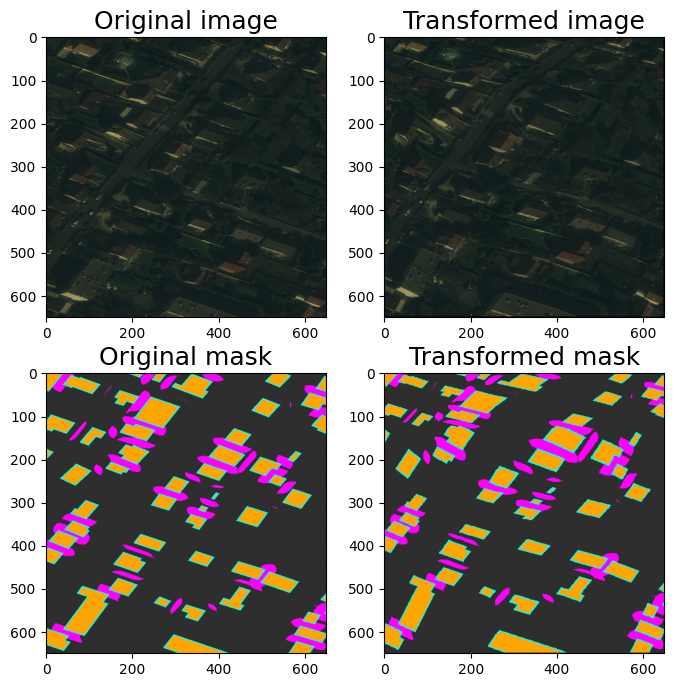

In [89]:
aug = A.Compose([
    A.OneOf([
        A.RandomSizedCrop(min_max_height=(50, 101), height=original_height, width=original_width, p=0.5),
        A.PadIfNeeded(min_height=original_height, min_width=original_width, p=0.5)
    ],p=1),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.OneOf([
        A.ElasticTransform(p=0.5, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
        A.GridDistortion(p=0.5),
        A.OpticalDistortion(distort_limit=1, shift_limit=0.5, p=1),
    ], p=0.8)])

random.seed(11)
augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_medium = augmented['image']
mask_medium = augmented['mask']

visualize_from_dataset(image, mask, transformed_image=image_medium, transformed_mask=mask_medium)


### Let's add non-spatial stransformations

Many non-spatial transformations like CLAHE, RandomBrightness, RandomContrast, RandomGamma can be also added. They will be applied only to the image and not the mask.

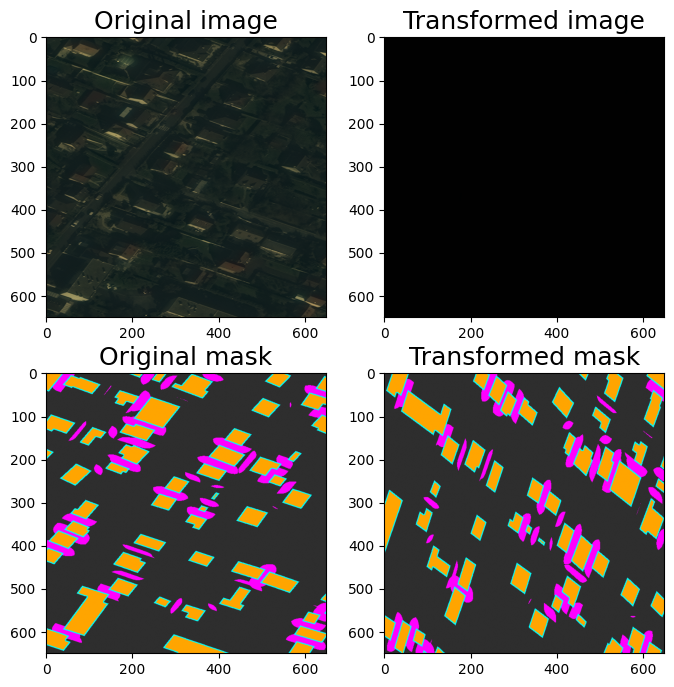

In [136]:
aug = A.Compose([
    A.OneOf([
        A.RandomSizedCrop(min_max_height=(50, 101), height=original_height, width=original_width, p=0.5),
        A.PadIfNeeded(min_height=original_height, min_width=original_width, p=0.5)
    ], p=1),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.OneOf([
        # A.ElasticTransform(alpha=120, sigma=120 * 0.05, p=0.5),
        A.GridDistortion(p=0.5),
        A.OpticalDistortion(distort_limit=2, shift_limit=0.5, p=1)
        ], p=0.8),
    A.CLAHE(p=0.8),
    A.RandomBrightnessContrast(p=0.8),
    A.RandomGamma(p=0.8)
    ])

# random.seed(11)
augmented = aug(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())

image_heavy = augmented['image']
mask_heavy = augmented['mask']

visualize_from_dataset(image, mask, transformed_image=image_heavy, transformed_mask=mask_heavy)

# Weather augmentations in Albumentations

torch.Size([3, 650, 650]) torch.Size([650, 650])


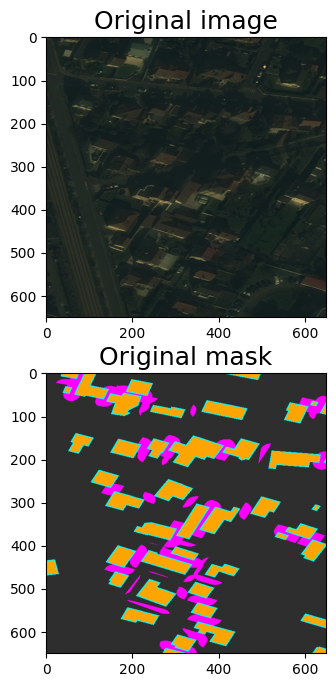

In [139]:
idx = random.choice(range(len(dataset)-1))
image, mask = dataset[idx]
original_height, original_width = image.shape[1:] # img.shape = CxHxW
print(image.shape, mask.shape)
visualize_from_dataset(image, mask)

## RandomRain

In [145]:
transform = A.Compose([
    A.RandomRain(
        brightness_coefficient=0,  # Increase brightness to prevent darkening
        drop_width=1,  # Thinner drops
        drop_length=10,  # Shorter streaks
        blur_value=1,  # Minimal blur
        rain_type="drizzle",
        p=1
    )],
)
random.seed(7)
transformed = transform(image=image.permute(1, 2, 0).numpy(), mask=mask.numpy())
visualize_from_dataset(image, mask, transformed_image=transformed['image'], transformed_mask=transformed['mask'])

ValidationError: 1 validation error for InitSchema
brightness_coefficient
  Input should be greater than 0 [type=greater_than, input_value=0, input_type=int]
    For further information visit https://errors.pydantic.dev/2.10/v/greater_than